In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import pathlib
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
from object_detection.core import model as m


while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
 
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)
 
  model_dir = pathlib.Path(model_dir)/"saved_model"
 
  model = tf.saved_model.load(str(model_dir))
 
  return model
 
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

model_name = 'ssdlite_mobilenet_v2_coco_2018_05_09'
detection_model = load_model(model_name)

    

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [8]:
import playsound as p
import threading

prediction_scores = []
#to generate the corresponding audio label of the detected object
def audioLabel(index):
    i=0
    path = "C:/Users/Raihan/computerVision/models/research/object_detection/audio_feedback/cocotext.txt"
    with open(path) as f:
        for line in f:
            line=f.read().splitlines()
            for items in line:
                content = items
                i+=1
                if i == index:
                    break
    return(content)

def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections
  

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
   
  return output_dict
delay = 0
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.

  image_np = np.array(Image.open(image_path))


  # Actual detection.
    
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  global prediction_scores
  for i in output_dict['detection_classes']:
            for j in (output_dict['detection_scores']):
                prediction_scores.append(j)
  self = output_dict['detection_scores']
  field = "vase"
  #print(m.groundtruth_lists(self, field))          
  print(output_dict['detection_scores'])  
  #print(prediction_scores)  
  display(Image.fromarray(image_np))

In [9]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[WindowsPath('models/research/object_detection/test_images/image1.jpg'),
 WindowsPath('models/research/object_detection/test_images/image2.jpg'),
 WindowsPath('models/research/object_detection/test_images/image3.jpg'),
 WindowsPath('models/research/object_detection/test_images/image4.jpg'),
 WindowsPath('models/research/object_detection/test_images/image5.jpg'),
 WindowsPath('models/research/object_detection/test_images/image6.jpg'),
 WindowsPath('models/research/object_detection/test_images/image7.jpg'),
 WindowsPath('models/research/object_detection/test_images/image8.jpg'),
 WindowsPath('models/research/object_detection/test_images/image9.jpg')]

[0.8016229 0.6245761]


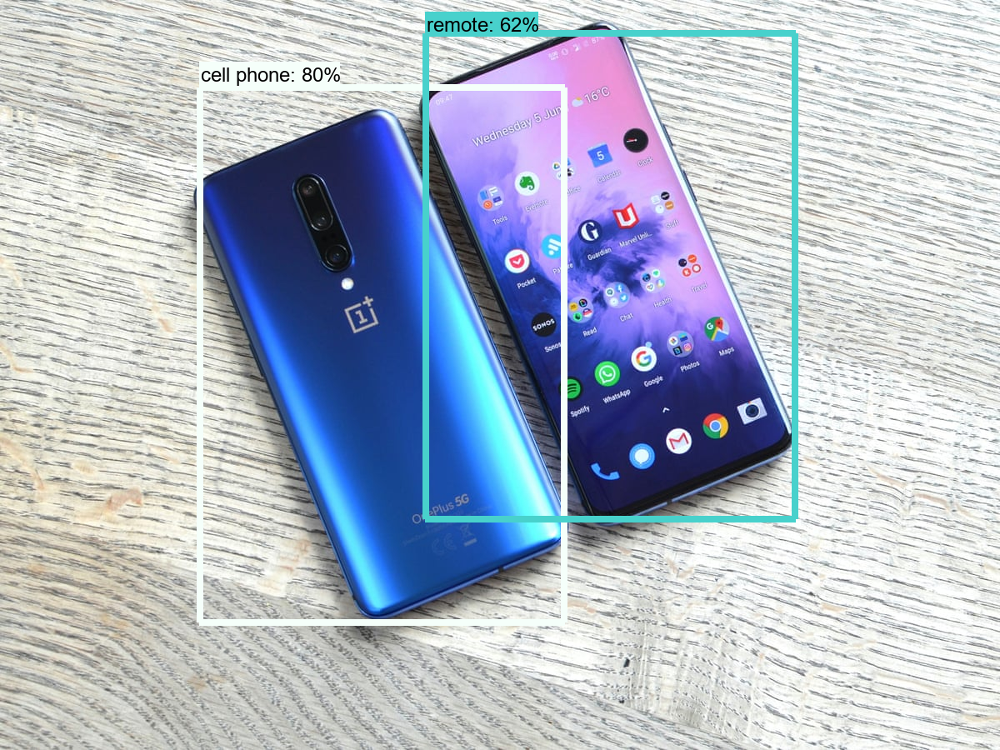

[0.9767457]


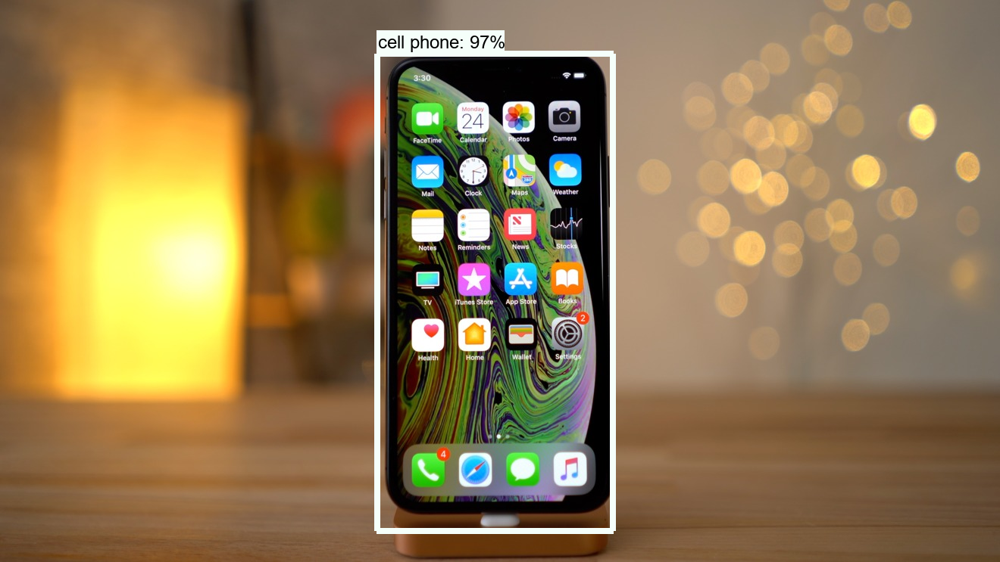

[0.91574144]


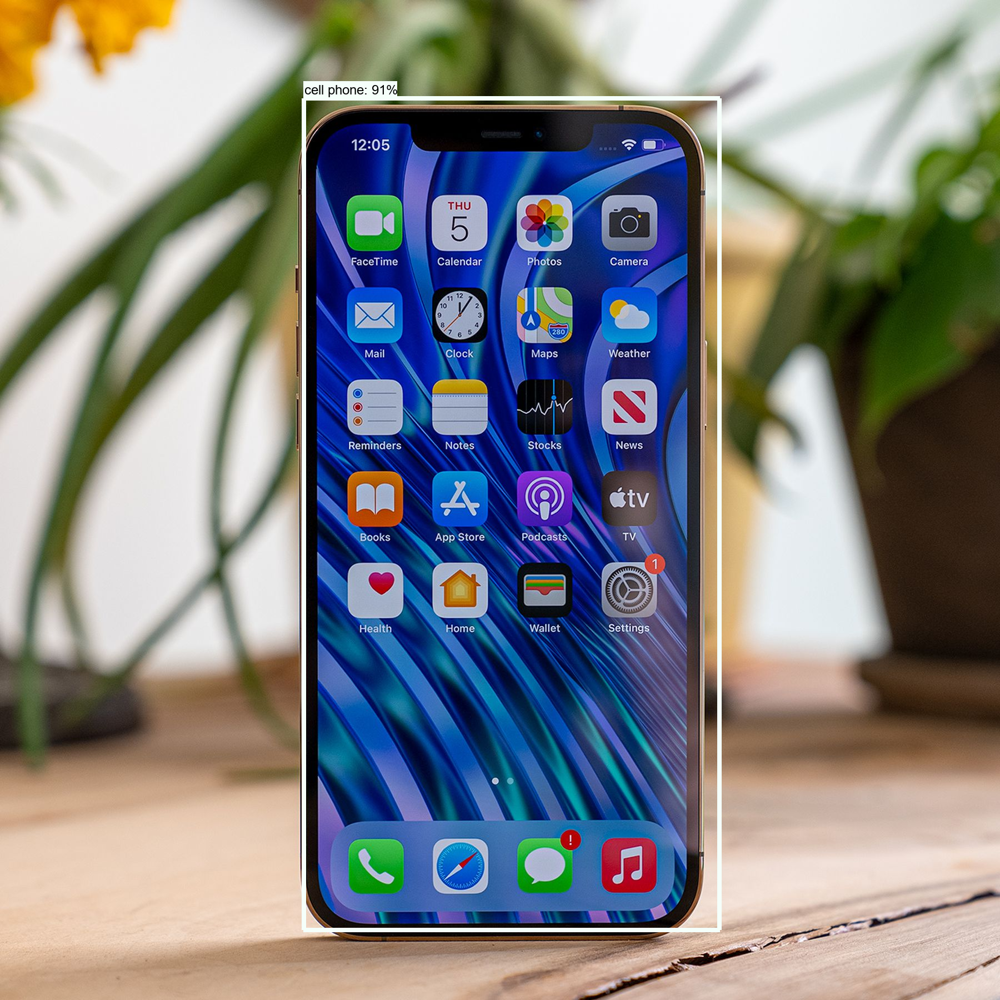

[0.8708973]


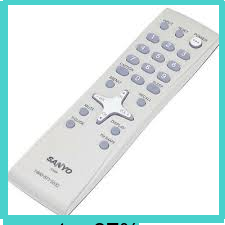

[0.9330512]


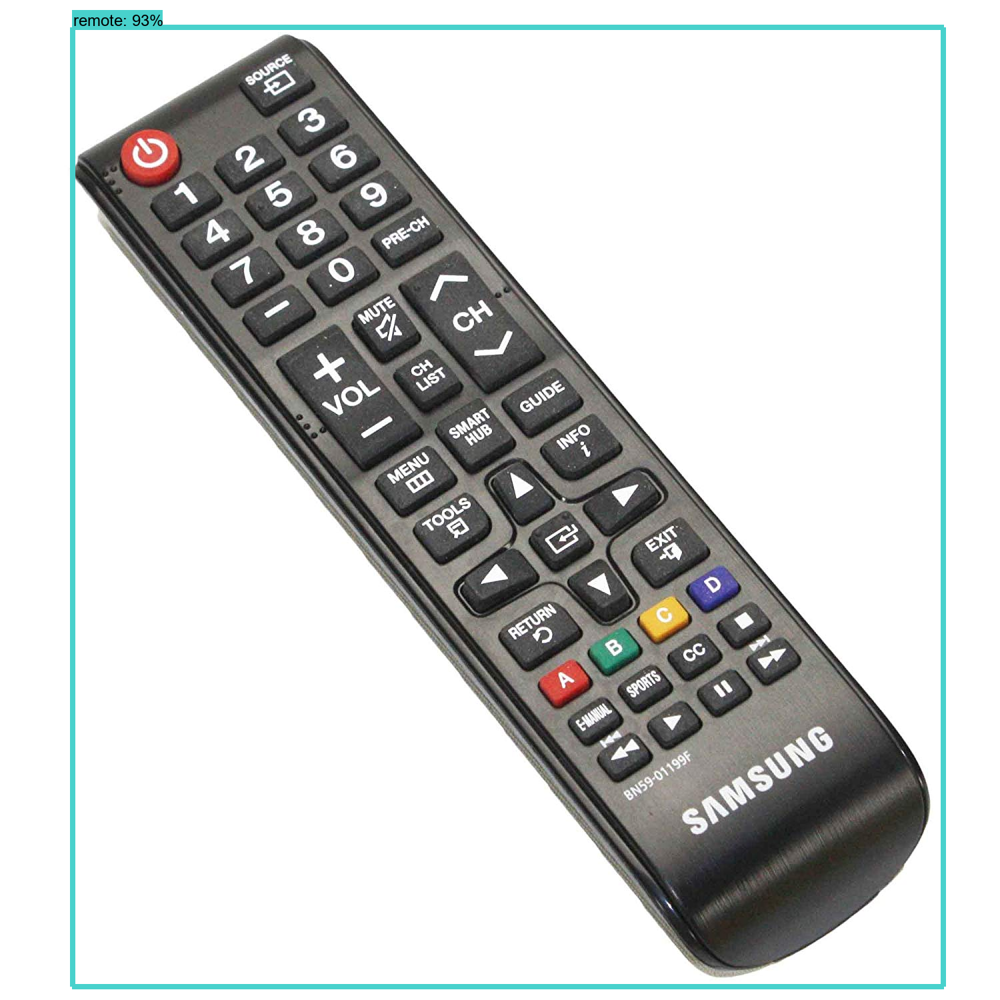

[0.9856732]


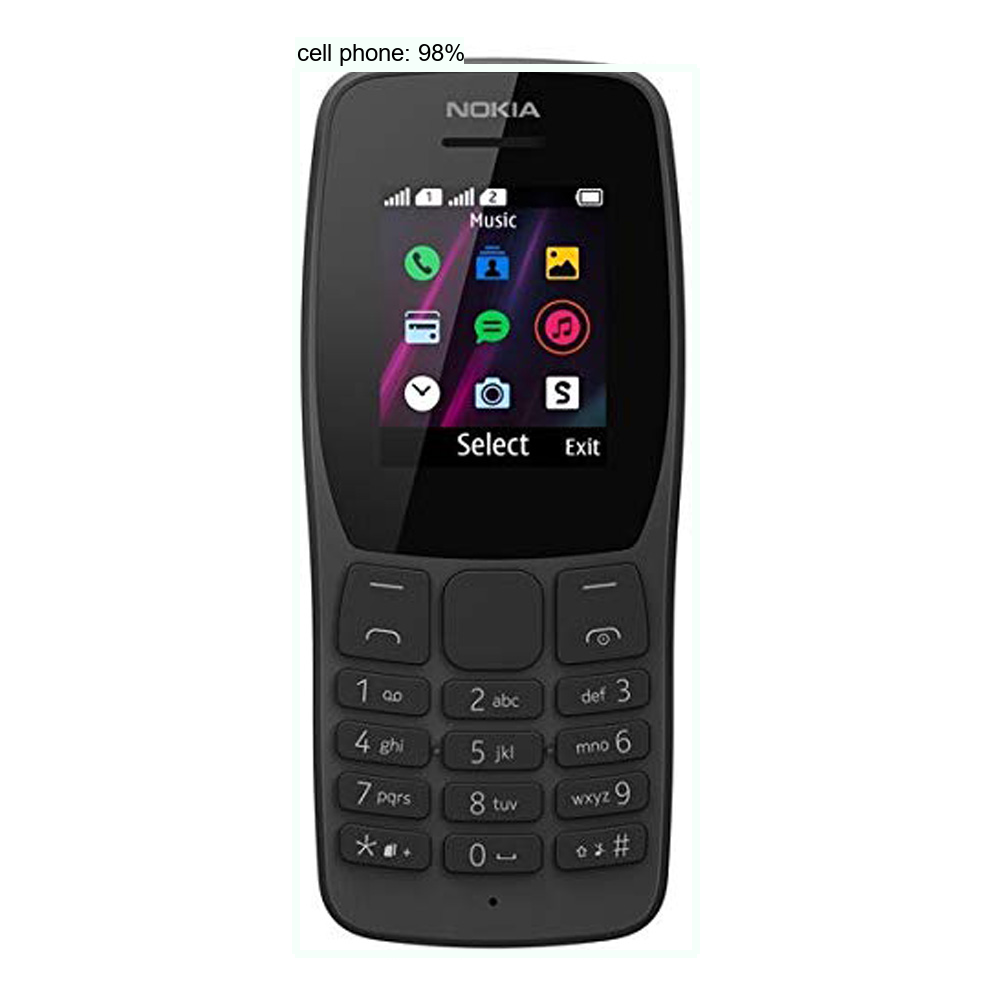

[0.9489957]


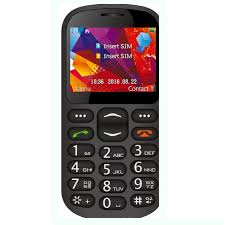

[0.8235148]


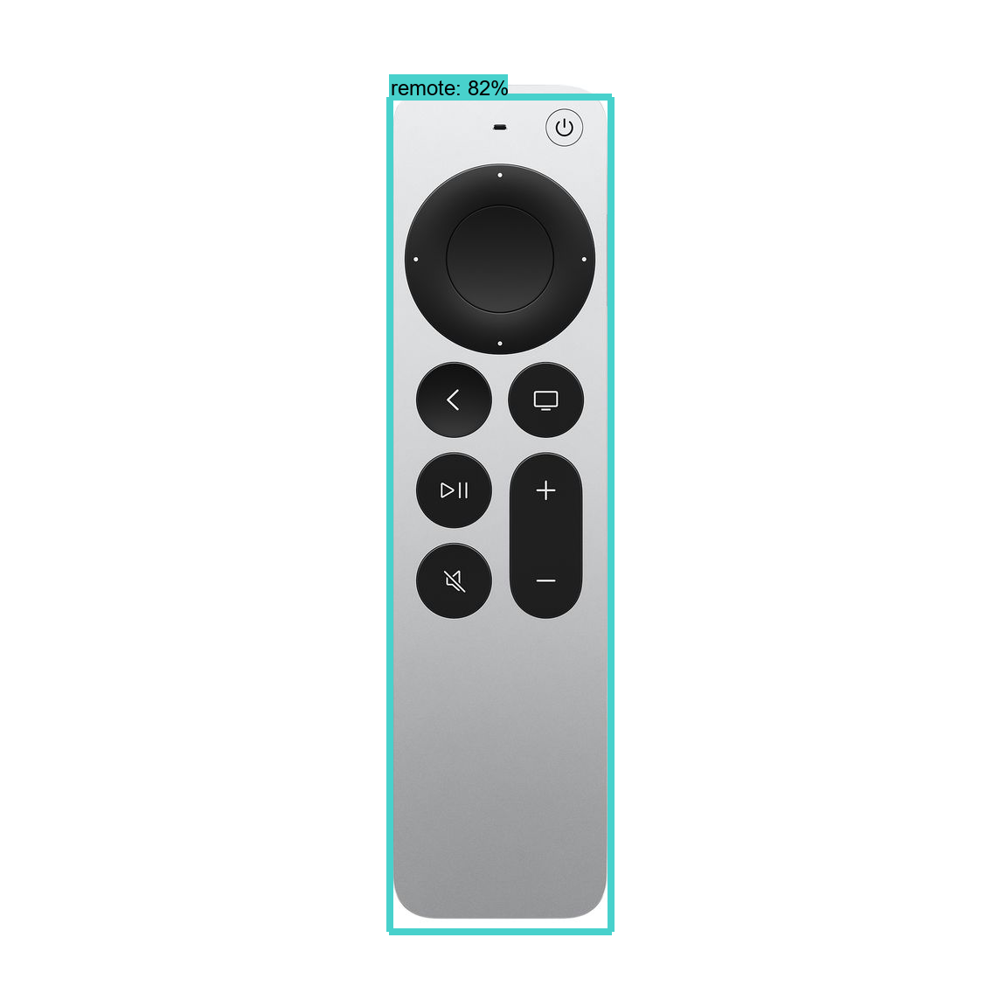

[0.79842484 0.53126484 0.30714422]


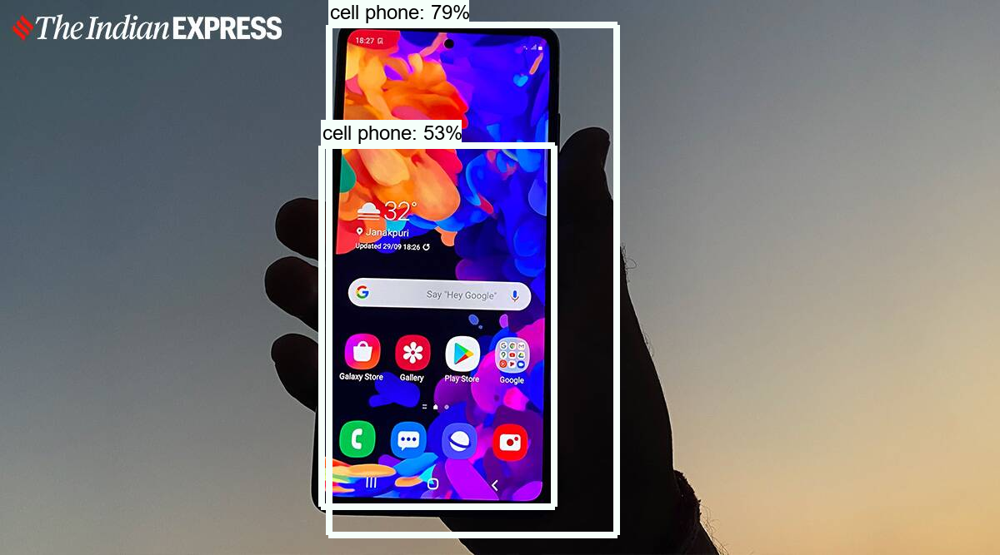

[0.8016229, 0.6245761, 0.8016229, 0.6245761, 0.9767457, 0.91574144, 0.8708973, 0.9330512, 0.9856732, 0.9489957, 0.8235148, 0.79842484, 0.53126484, 0.30714422, 0.79842484, 0.53126484, 0.30714422, 0.79842484, 0.53126484, 0.30714422]


In [10]:
for image_path in TEST_IMAGE_PATHS:
    show_inference(detection_model, image_path)


print(prediction_scores)
 